In [2]:
#Importing libraries

import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import matplotlib
plt.style.use('ggplot')
from matplotlib.pyplot import figure


%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)

pd.options.mode.chained_assignment = None #adjusts the configuration of the plots to be created

#reading the dataset

df = pd.read_csv('C:/Users/DELL/OneDrive/Desktop/Portfolio Project Python/movies.csv')

In [3]:
df.head()

df.size

115020

In [4]:
#check for missing data

for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print(col, ' - ', pct_missing, '%')

name  -  0.0 %
rating  -  0.010041731872717789 %
genre  -  0.0 %
year  -  0.0 %
released  -  0.0002608242044861763 %
score  -  0.0003912363067292645 %
votes  -  0.0003912363067292645 %
director  -  0.0 %
writer  -  0.0003912363067292645 %
star  -  0.00013041210224308815 %
country  -  0.0003912363067292645 %
budget  -  0.2831246739697444 %
gross  -  0.02464788732394366 %
company  -  0.002217005738132499 %
runtime  -  0.0005216484089723526 %


In [5]:
#to drop nulls
df = df.dropna()

In [6]:
df.dtypes

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget      float64
gross       float64
company      object
runtime     float64
dtype: object

In [7]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [15]:
df.sort_values(by = ['gross'], inplace = False, ascending = False )

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.80,1100000.00,James Cameron,James Cameron,Sam Worthington,United States,237000000.00,2847246203.00,Twentieth Century Fox,162.00
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.40,903000.00,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000.00,2797501328.00,Marvel Studios,181.00
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.80,1100000.00,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000.00,2201647264.00,Twentieth Century Fox,194.00
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.80,876000.00,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000.00,2069521700.00,Lucasfilm,138.00
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.40,897000.00,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000.00,2048359754.00,Marvel Studios,149.00
7480,The Lion King,PG,Animation,2019,"July 19, 2019 (United States)",6.90,222000.00,Jon Favreau,Jeff Nathanson,Donald Glover,United States,260000000.00,1670727580.00,Walt Disney Pictures,118.00
6653,Jurassic World,PG-13,Action,2015,"June 12, 2015 (United States)",7.00,593000.00,Colin Trevorrow,Rick Jaffa,Chris Pratt,United States,150000000.00,1670516444.00,Universal Pictures,124.00
6043,The Avengers,PG-13,Action,2012,"May 4, 2012 (United States)",8.00,1300000.00,Joss Whedon,Joss Whedon,Robert Downey Jr.,United States,220000000.00,1518815515.00,Marvel Studios,143.00
6646,Furious 7,PG-13,Action,2015,"April 3, 2015 (United States)",7.10,370000.00,James Wan,Chris Morgan,Vin Diesel,United States,190000000.00,1515341399.00,Universal Pictures,137.00
7494,Frozen II,PG,Animation,2019,"November 22, 2019 (United States)",6.80,148000.00,Chris Buck,Jennifer Lee,Kristen Bell,United States,150000000.00,1450026933.00,Walt Disney Animation Studios,103.00


In [8]:
#to change exponential number to float format
pd.set_option('display.float_format', '{:.2f}'.format)

In [9]:
#to be able to scroll through all rows
pd.set_option('display.max_rows', None)

In [17]:
#making released column consistent with format like 'April 26, 2019'


import re
found = 0
notfound = []
for date in df['released']:
    #regex expression to check for given date format
    x = re.search("\w+\s\d+\,\s\d{4}", date)
    if x:
        found += 1
    else:
        notfound.append(date)
        

print(found)
print(notfound)

5407
[]


In [15]:
#dropping rows that dont have the given format of date in released column
for year in notfound:
    rownum = df['released'][df['released'] == year].index
    df.drop(rownum.astype(int), inplace = True)

In [18]:
#dropping duplicates
df = df.drop_duplicates()

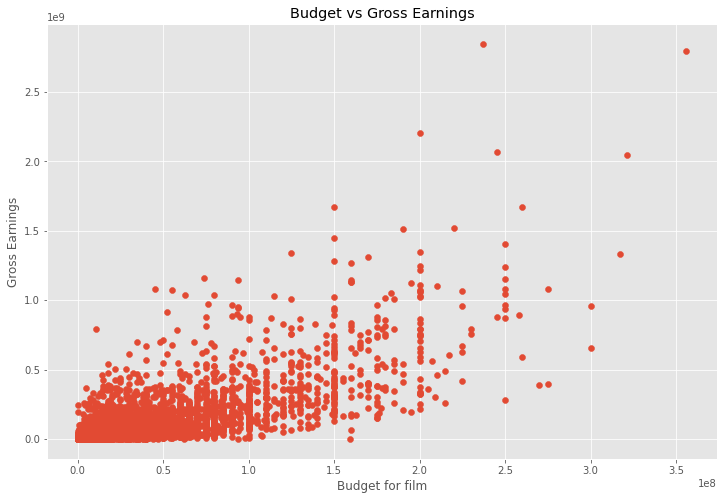

In [21]:
#scatterplot for gross vs budget

plt.scatter(x = df['budget'], y = df['gross'])

plt.title("Budget vs Gross Earnings")

plt.ylabel("Gross Earnings")

plt.xlabel("Budget for film")

plt.show()

<AxesSubplot:xlabel='budget', ylabel='gross'>

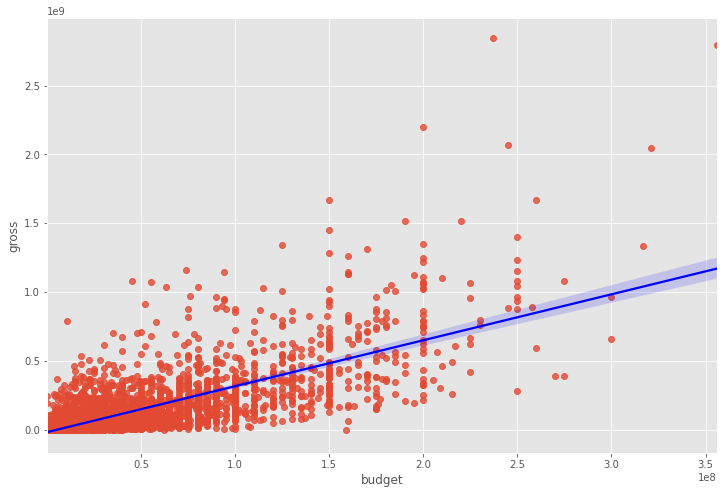

In [23]:
# Plot budget vs gross using seaborn

sns.regplot(x = 'budget', y = 'gross', data = df, line_kws = {"color":"blue"})

In [25]:
#Lets start looking at correlations

#pearson (by default)
df.corr()

#kendall, spearman (other types of correlation)
df.corr(method = 'kendall')

#in both methods highest correlation b/w gross and budget

,year,score,votes,budget,gross,runtime
year,1.00,0.04,0.29,0.22,0.24,0.06
score,0.04,1.00,0.35,-0.01,0.12,0.29
votes,0.29,0.35,1.00,0.34,0.55,0.21
budget,0.22,-0.01,0.34,1.00,0.51,0.23
gross,0.24,0.12,0.55,0.51,1.00,0.18
runtime,0.06,0.29,0.21,0.23,0.18,1.00


Text(0.5, 51.0, 'Movie features')

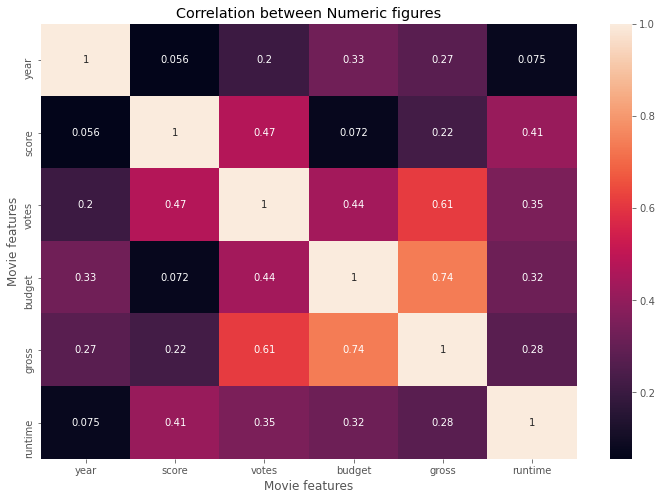

In [29]:
#plotting correlation
correlation_matrix = df.corr(method = 'pearson')

sns.heatmap(correlation_matrix, annot = True)

plt.title("Correlation between Numeric figures")

plt.ylabel("Movie features")

plt.xlabel("Movie features")


In [31]:
#to find correlation with object type features we have to numerise them

df_num = df

for col in df_num.columns:
    if(df_num[col].dtype == 'object'):
        df_num[col] = df_num[col].astype('category')
        df_num[col] = df_num[col].cat.codes

df_num

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,4679,6,6,1980,1297,8.40,927000.00,1791,2828,694,46,19000000.00,46998772.00,1420,146.00
1,3917,6,1,1980,1120,5.80,65000.00,1574,1155,213,47,4500000.00,58853106.00,448,104.00
2,3630,4,0,1980,1352,8.70,1200000.00,754,1815,1151,47,18000000.00,538375067.00,940,124.00
3,204,4,4,1980,1120,7.70,221000.00,885,1410,1467,47,3500000.00,83453539.00,1103,88.00
4,732,6,4,1980,1163,7.30,108000.00,716,349,270,47,6000000.00,39846344.00,1078,98.00
5,1504,6,9,1980,1911,6.40,123000.00,1754,3076,154,47,550000.00,39754601.00,1103,95.00
6,3918,6,0,1980,1352,7.90,188000.00,970,573,855,47,27000000.00,115229890.00,1391,133.00
7,3111,6,3,1980,524,8.20,330000.00,1265,1254,1462,47,18000000.00,23402427.00,386,129.00
8,3720,4,0,1980,1339,6.80,101000.00,1602,1399,590,47,54000000.00,108185706.00,544,127.00
9,4388,6,3,1980,1747,7.00,10000.00,2007,278,399,47,10000000.00,15795189.00,1385,100.00


Text(0.5, 51.0, 'Movie features')

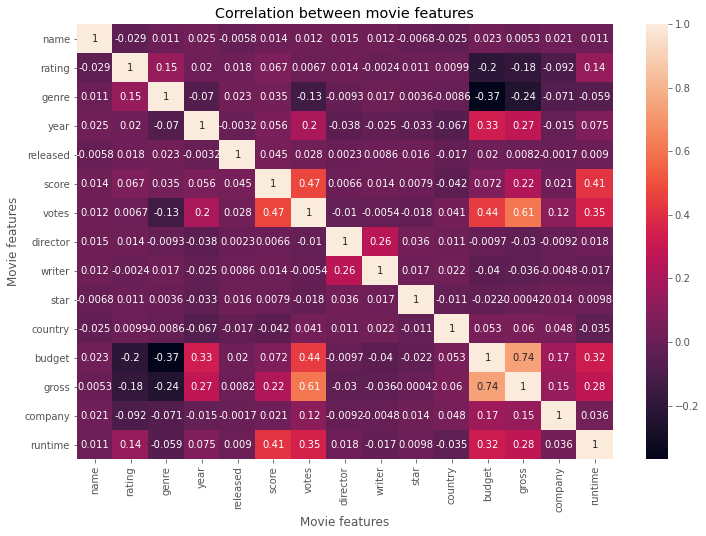

In [32]:
correlation_matrix = df_num.corr(method = 'pearson')

sns.heatmap(correlation_matrix, annot = True)

plt.title("Correlation between movie features")

plt.ylabel("Movie features")

plt.xlabel("Movie features")

In [ ]:
#here we can see that the most correlated movie features to gross earnings are budget and votes
#hence we can say that a movie that has a greater budget and higher votes earns more in gross revenue